<a href="https://www.kaggle.com/code/ashadullah/text-to-image-generation-using-opensource-model?scriptVersionId=172009898" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
# Install necessary libraries
!pip install torch torchvision diffusers transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 10.1 MB/s eta 0:00:00a 0:00:01


In [14]:
from diffusers import StableDiffusionPipeline
import torch

# Load the Stable Diffusion model
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to(device)

Using device: cuda
Number of available GPUs: 2


In [18]:
def generate_image(prompt, height=2048, width=2048):
    """
    Generate an image from a text prompt using the Stable Diffusion model.
    
    Args:
        prompt (str): The text prompt describing the person and their background.
        height (int): The desired height of the generated image (default: 2048).
        width (int): The desired width of the generated image (default: 2048).
    
    Returns:
        PIL.Image: The generated image.
    """
    image = pipe(prompt, height=height, width=width, num_inference_steps=50, guidance_scale=7.5)
    return image.images[0]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [19]:
from torchvision.transforms.functional import resize
from PIL import Image

def upscale_image(image, target_size=(2048, 2048)):
    """
    Upscale the generated image to the target size.
    
    Args:
        image (PIL.Image): The image to be upscaled.
        target_size (tuple): The desired size of the upscaled image (default: (2048, 2048)).
    
    Returns:
        PIL.Image: The upscaled image.
    """
    image = resize(image, size=target_size, antialias=True)
    return image

In [20]:
# Example usage
prompt = "A photorealistic portrait of a young woman with long dark hair, wearing a white dress, standing in a lush, green garden."
generated_image = generate_image(prompt)
upscaled_image = upscale_image(generated_image)

# Display the generated and upscaled images
upscaled_image.show()

AttributeError: 'StableDiffusionPipeline' object has no attribute 'parameters'

In [ ]:
import matplotlib.pyplot as plt
upscaled_image = upscale_image(generated_image)

# Display the generated and upscaled images
plt.figure(figsize=(16, 16))
plt.imshow(upscaled_image)
plt.axis('off')
plt.show()

In [29]:
import torch
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline
from torchvision.transforms.functional import resize

In [30]:
# Set up the environment
!pip install torch torchvision diffusers transformers

In [31]:
# Detect and assign the available GPUs
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

num_gpus = torch.cuda.device_count()
print(f"Number of available GPUs: {num_gpus}")

Using device: cuda
Number of available GPUs: 2


In [32]:
# Load the Stable Diffusion model on the GPUs
pipe = []
for i in range(num_gpus):
    pipe.append(StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to(f"cuda:{i}"))

def generate_image(prompt, height=2048, width=2048):
    """
    Generate an image from a text prompt using the Stable Diffusion model.
    
    Args:
        prompt (str): The text prompt describing the person and their background.
        height (int): The desired height of the generated image (default: 2048).
        width (int): The desired width of the generated image (default: 2048).
    
    Returns:
        PIL.Image: The generated image.
    """
    images = []
    for model in pipe:
        image = model(prompt, height=height, width=width, num_inference_steps=50, guidance_scale=7.5)
        images.append(image.images[0])
    
    return torch.stack(images).mean(dim=0)

def upscale_image(image, target_size=(2048, 2048)):
    """
    Upscale the generated image to the target size.
    
    Args:
        image (PIL.Image): The image to be upscaled.
        target_size (tuple): The desired size of the upscaled image (default: (2048, 2048)).
    
    Returns:
        PIL.Image: The upscaled image.
    """
    image = resize(image, size=target_size, antialias=True)
    return image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [33]:
# Example usage
prompt = "A photorealistic portrait of a young woman with long dark hair, wearing a white dress, standing in a lush, green garden."
generated_image = generate_image(prompt)
upscaled_image = upscale_image(generated_image)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]


KeyboardInterrupt



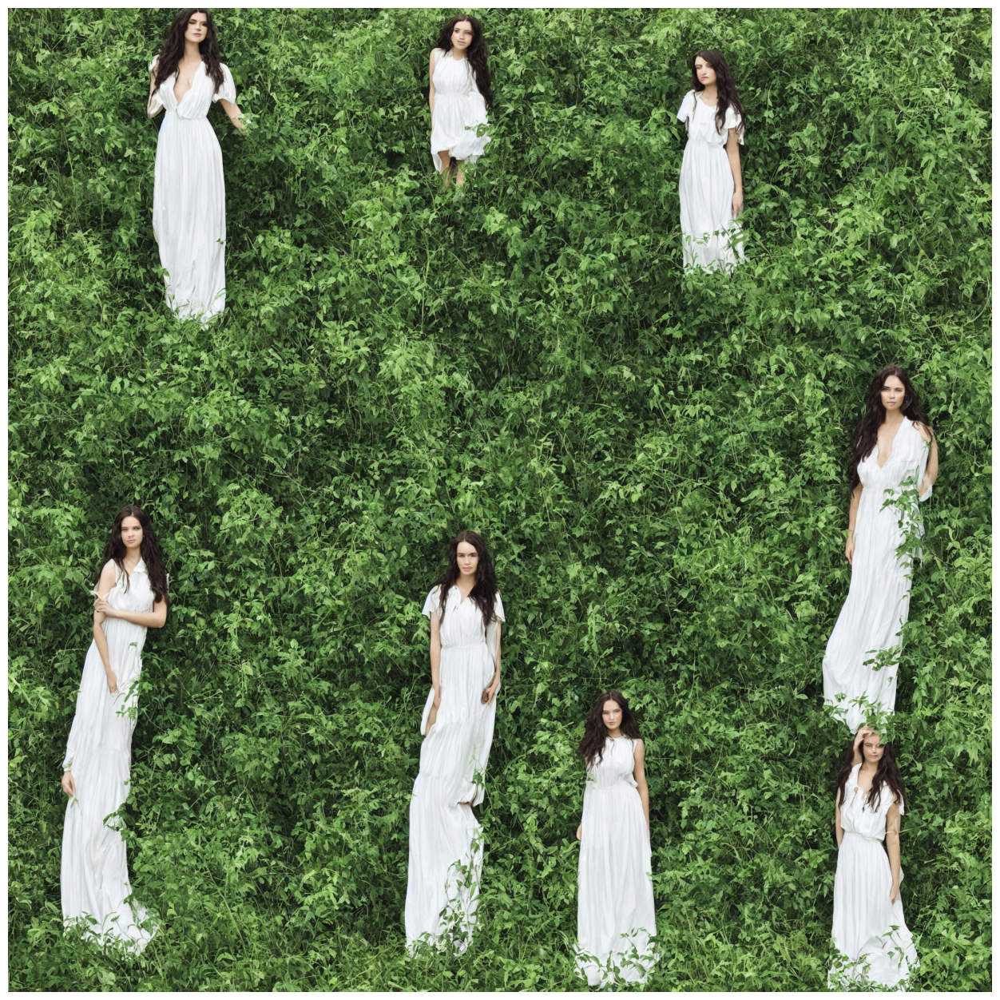

In [34]:
# Display the generated and upscaled images
plt.figure(figsize=(16, 16))
plt.imshow(upscaled_image)
plt.axis('off')
plt.show()

In [35]:
# Import necessary libraries
import torch
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline
from torchvision.transforms.functional import resize

In [36]:
# Set up the environment
!pip install torch torchvision diffusers transformers

In [37]:
# Detect and assign the available GPUs
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

num_gpus = torch.cuda.device_count()
print(f"Number of available GPUs: {num_gpus}")

Using device: cuda
Number of available GPUs: 2


In [46]:
# Load the Stable Diffusion model on the GPUs
pipe = []
for i in range(num_gpus):
    model = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to(f"cuda:{i}")
    model = torch.nn.DataParallel(model)  # Use DataParallel for multi-GPU usage
    pipe.append(model)

def generate_image(prompt, height=2048, width=2048):
    """
    Generate an image from a text prompt using the Stable Diffusion model.
    
    Args:
        prompt (str): The text prompt describing the person and their background.
        height (int): The desired height of the generated image (default: 2048).
        width (int): The desired width of the generated image (default: 2048).
    
    Returns:
        PIL.Image: The generated image.
    """
    images = []
    for model in pipe:
        image = model(prompt, height=height, width=width, num_inference_steps=50, guidance_scale=7.5)
        images.append(image.images[0])
    
    return torch.stack(images).mean(dim=0)

def upscale_image(image, target_size=(2048, 2048)):
    """
    Upscale the generated image to the target size.
    
    Args:
        image (PIL.Image): The image to be upscaled.
        target_size (tuple): The desired size of the upscaled image (default: (2048, 2048)).
    
    Returns:
        PIL.Image: The upscaled image.
    """
    image = resize(image, size=target_size, antialias=True)
    return image


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [44]:
# Example usage
prompt = "A highly detailed, photorealistic portrait of a young woman with long dark hair, wearing a white dress, standing in the center of a road, busy new york times square."
generated_image = generate_image(prompt)
upscaled_image = upscale_image(generated_image)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

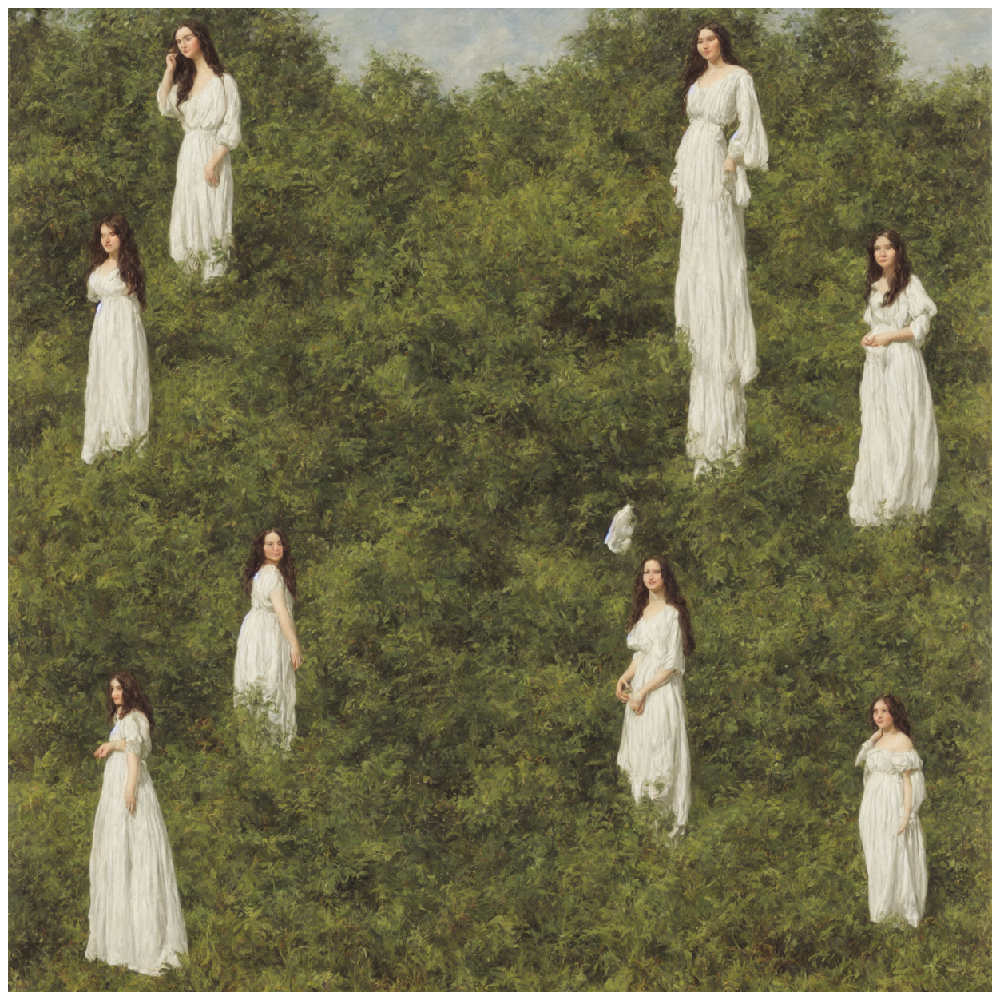

In [45]:
# Display the generated and upscaled images
plt.figure(figsize=(16, 16))
plt.imshow(upscaled_image)
plt.axis('off')
plt.show()

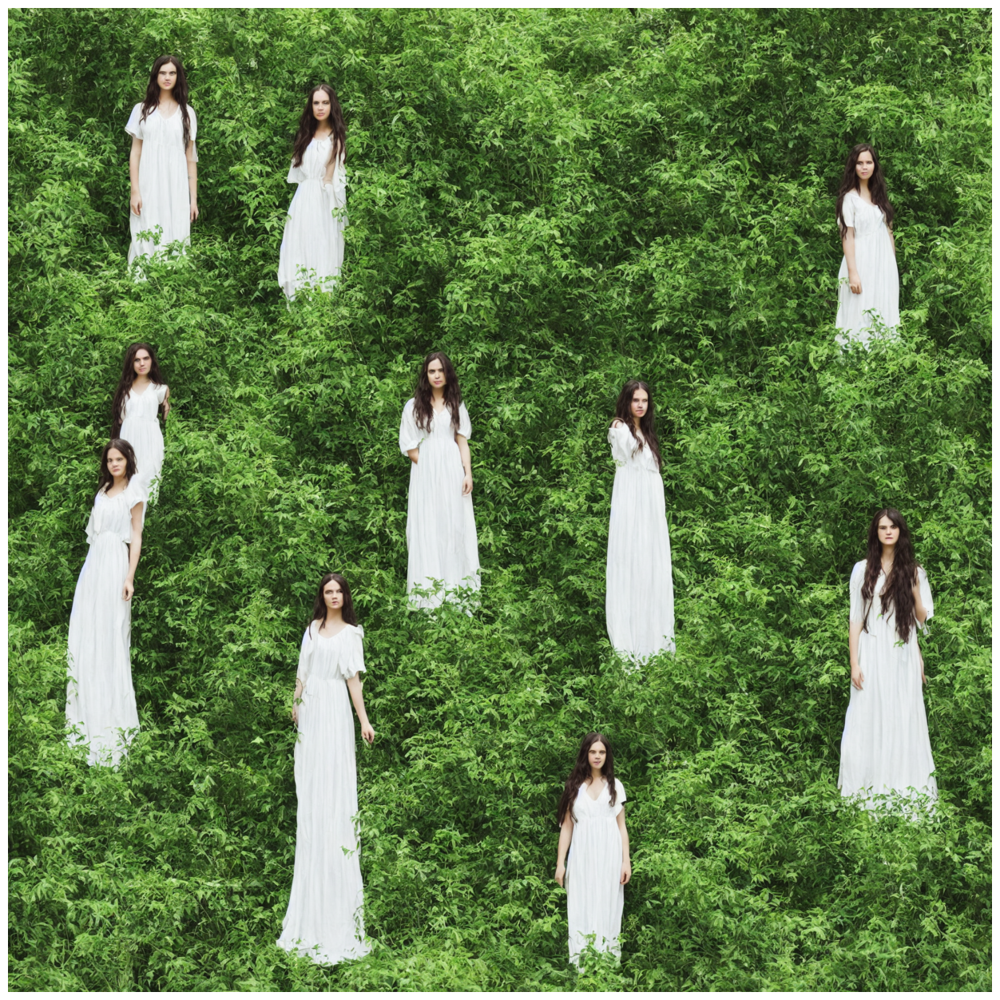

In [42]:
# Display the generated and upscaled images
plt.figure(figsize=(16, 16))
plt.imshow(upscaled_image)
plt.axis('off')
plt.show()

In [ ]:
# Import necessary libraries
import torch
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline
from torchvision.transforms.functional import resize

# Set up the environment
!pip install torch torchvision diffusers transformers

# Detect and assign the available GPUs
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

num_gpus = torch.cuda.device_count()
print(f"Number of available GPUs: {num_gpus}")

# Load the Stable Diffusion model on the GPUs
pipe = []
for i in range(num_gpus):
    model = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to(f"cuda:{i}")
    model = torch.nn.DataParallel(model)  # Use DataParallel for multi-GPU usage
    pipe.append(model)

def generate_image(prompt, height=2048, width=2048):
    """
    Generate an image from a text prompt using the Stable Diffusion model.
    
    Args:
        prompt (str): The text prompt describing the person and their background.
        height (int): The desired height of the generated image (default: 2048).
        width (int): The desired width of the generated image (default: 2048).
    
    Returns:
        PIL.Image: The generated image.
    """
    images = []
    for model in pipe:
        image = model(prompt, height=height, width=width, num_inference_steps=50, guidance_scale=7.5)
        images.append(image.images[0])
    
    return torch.stack(images).mean(dim=0)

def upscale_image(image, target_size=(2048, 2048)):
    """
    Upscale the generated image to the target size.
    
    Args:
        image (PIL.Image): The image to be upscaled.
        target_size (tuple): The desired size of the upscaled image (default: (2048, 2048)).
    
    Returns:
        PIL.Image: The upscaled image.
    """
    image = resize(image, size=target_size, antialias=True)
    return image

# Example usage
prompt = "A photorealistic portrait of a young woman with long dark hair, wearing a white dress, standing in a lush, green garden."
generated_image = generate_image(prompt)
upscaled_image = upscale_image(generated_image)

# Display the generated and upscaled images
plt.figure(figsize=(16, 16))
plt.imshow(upscaled_image)
plt.axis('off')
plt.show()
